ENCS5343 Computer Vision

Assignment#1

Comparing Simple Smoothing Filters with Advanced Filters on Noisy Images

In [34]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [35]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img)
    return images

images = load_images_from_folder('images')

In [37]:
images[0].shape

(4032, 3024)

In [41]:
len(images)

4

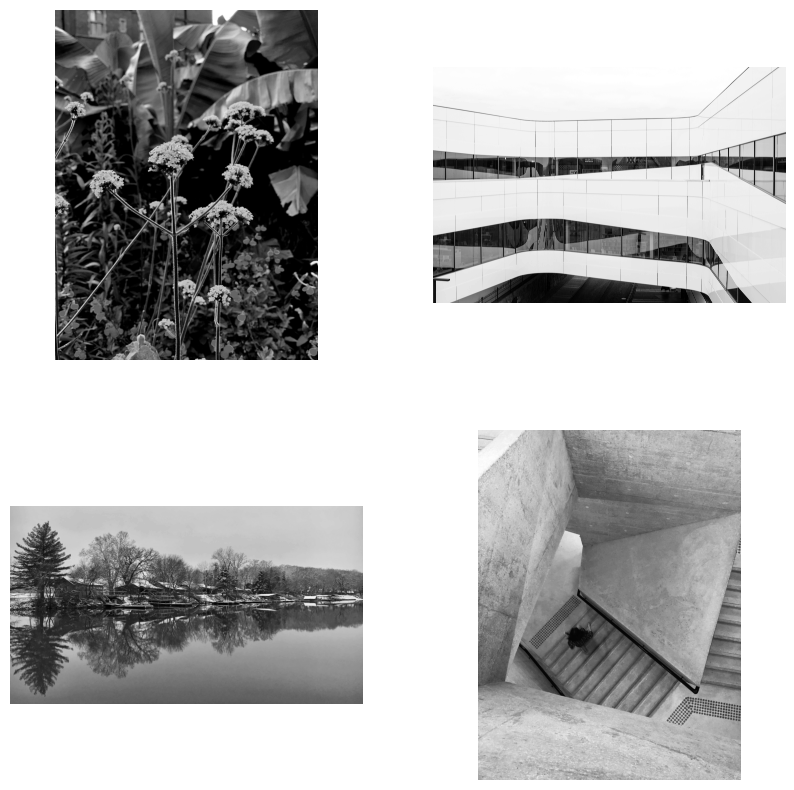

In [60]:
#show images as grid 2 in each row 
fig, axs = plt.subplots(len(images)//2, 2, figsize=(10, 10))
for i, img in enumerate(images):
    axs[i//2, i%2].imshow(img, cmap='gray')
    axs[i//2, i%2].axis('off')
plt.show()



In [39]:
#Add  different  types  of  noise  (e.g.,Gaussian  noise,  Salt-and-Pepper  noise)  with varying intensity levels (low, medium, high)


def add_gaussian_noise(image, mean=0, sigma=25):
    row, col = image.shape
    gauss = np.random.normal(mean, sigma, (row, col))
    noisy = image + gauss
    # Clip the values to be between 0 and 255
    noisy = np.clip(noisy, 0, 255)
    # Convert to unsigned 8-bit integer
    noisy = np.uint8(noisy)
    
    return noisy

#If amount=0.004 and s_vs_p=0.5, the function will turn approximately 0.4% of the pixels into salt or pepper, with half being white (salt) and half being black (pepper).
def add_salt_pepper_noise(image, amount=0.004):
    row, col = image.shape
    s_vs_p = 0.7  # Salt to pepper ratio
    out = np.copy(image)

    # Salt noise (white pixels)
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    out[coords[0], coords[1]] = 255

    # Pepper noise (black pixels)
    num_pepper = np.ceil(amount * image.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    out[coords[0], coords[1]] = 0

    return out


In [40]:
# {0:{gaussian: [], salt_pepper: []}, 1:{gaussian: [], salt_pepper: []}, ...}
images_with_noise = {i: {'gaussian': [], 'salt_pepper': []} for i in range(len(images))}

gaus_values = [50, 150, 300]
salt_pepper_values = [0.1, 0.2, 0.5]

for i, img in enumerate(images):
    
    for value in gaus_values:
        images_with_noise[i]['gaussian'].append(add_gaussian_noise(img, sigma=value))

    for value in salt_pepper_values:
        images_with_noise[i]['salt_pepper'].append(add_salt_pepper_noise(img, amount=value))

Showing Gaussian noise for image 1:


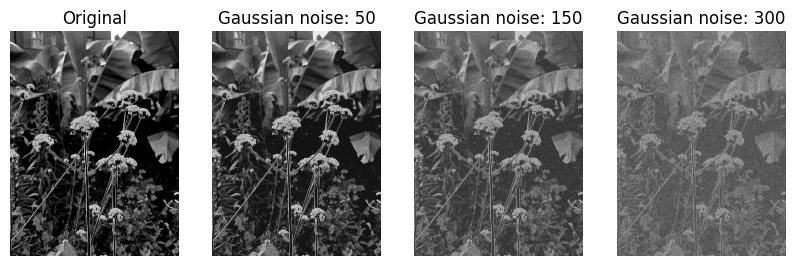

Showing Gaussian noise for image 2:


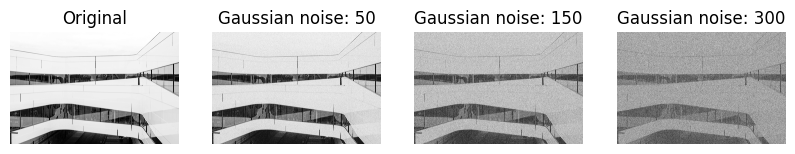

Showing Gaussian noise for image 3:


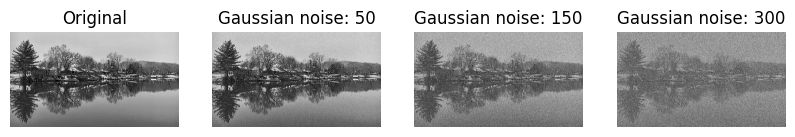

Showing Gaussian noise for image 4:


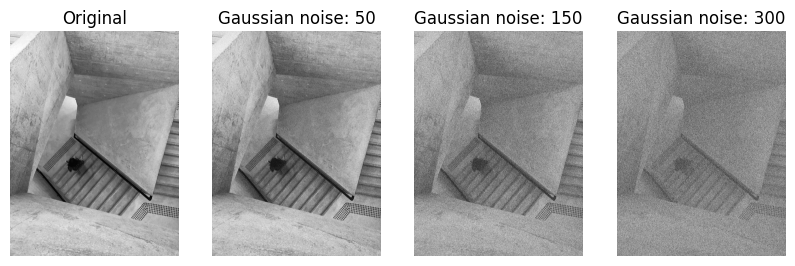

In [66]:

for i in range(len(images)):
    print(f"Showing Gaussian noise for image {i+1}:")
    fig, axs = plt.subplots(1, len(gaus_values)+1, figsize=(10, 10))
    axs[0].imshow(images[i], cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Original')

    for j, img in enumerate(images_with_noise[i]['gaussian']):
        axs[j+1].imshow(img, cmap='gray')
        axs[j+1].axis('off')
        axs[j+1].set_title(f'Gaussian noise: {gaus_values[j]}')

    plt.show()


Showing salt_pepper noise for image 1:


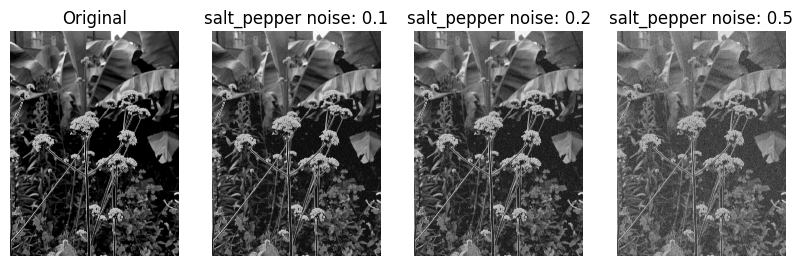

Showing salt_pepper noise for image 2:


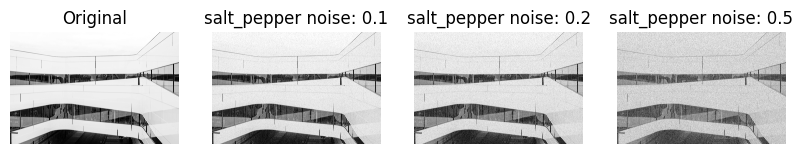

Showing salt_pepper noise for image 3:


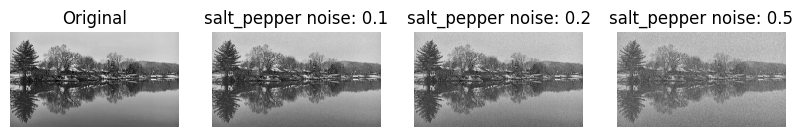

Showing salt_pepper noise for image 4:


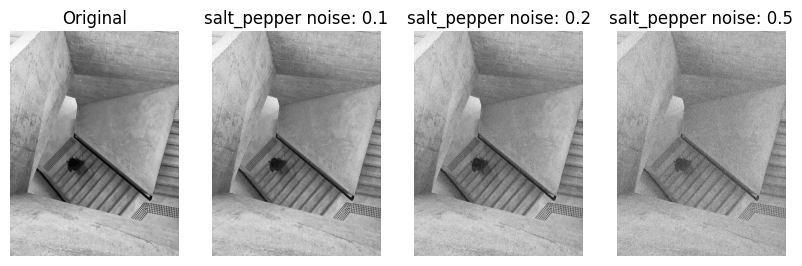

In [67]:

for i in range(len(images)):
    print(f"Showing salt_pepper noise for image {i+1}:")
    fig, axs = plt.subplots(1, len(salt_pepper_values)+1, figsize=(10, 10))
    axs[0].imshow(images[i], cmap='gray')
    axs[0].axis('off')
    axs[0].set_title('Original')

    for j, img in enumerate(images_with_noise[i]['salt_pepper']):
        axs[j+1].imshow(img, cmap='gray')
        axs[j+1].axis('off')
        axs[j+1].set_title(f'salt_pepper noise: {salt_pepper_values[j]}')

    plt.show()


## Simple Filters

In [ ]:
kernel_sizes = [3,15, 35]

In [ ]:
def print_with_border(message):
    border_length = len(message) + 4  
    print('*' * border_length)          
    print('* ' + message + ' *')        
    print('*' * border_length) 
    print()         

### Box Filter

#### Gaussian Noise

In [111]:

#images_with_box_filter_gaussian = {0:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, 1:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, ...}

images_with_box_filter_gaussian = {i: {n: [] for n in range (len(gaus_values))} for i in range(len(images))}

images_with_box_filter_gaussian

for i in range(len(images)):
    for j in range(len(gaus_values)):
        for k in kernel_sizes:
            images_with_box_filter_gaussian[i][j].append(cv2.blur(images_with_noise[i]['gaussian'][j], (k, k)))

            


In [ ]:
import matplotlib.pyplot as plt


for i in range(len(images)):
    print_with_border(f"Showing images with box filter for image {i + 1}:")

    for j in range(len(gaus_values)):
        print(f"\n\tShowing images with box filter for Gaussian noise {gaus_values[j]}:")

        fig, axs = plt.subplots(1, len(kernel_sizes)+2, figsize=(10, 10))

        axs[0].imshow(images[i], cmap='gray')
        axs[0].axis('off')
        axs[0].set_title('Original')

        axs[1].imshow(images_with_noise[i]['gaussian'][j], cmap='gray')
        axs[1].axis('off')
        axs[1].set_title(f'Gaussian noise: {gaus_values[j]}')

        for k in range(len(kernel_sizes)):
            axs[k+2].imshow(images_with_box_filter_gaussian[i][j][k], cmap='gray')
            axs[k+2].axis('off')
            axs[k+2].set_title(f'Box filter: {kernel_sizes[k]}')

        plt.tight_layout()

        plt.show()

    



#### Salt_Pepper Noise

In [114]:

#images_with_box_filter_salt_peper = {0:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, 1:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, ...}

images_with_box_filter_salt_pepper = {i: {n: [] for n in range (len(gaus_values))} for i in range(len(images))}



for i in range(len(images)):
    for j in range(len(gaus_values)):
        for k in kernel_sizes:
            images_with_box_filter_salt_pepper[i][j].append(cv2.blur(images_with_noise[i]['salt_pepper'][j], (k, k)))

            


***********************************************
* Showing images with box filter for image 1: *
***********************************************


	==> Showing images with box filter for salt_pepper noise 0.1:


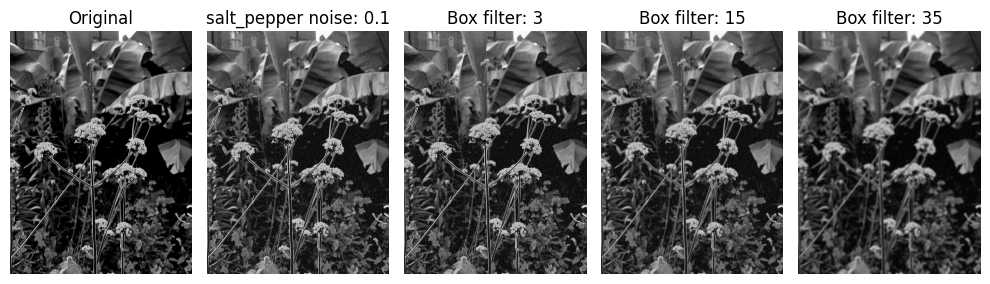


	==> Showing images with box filter for salt_pepper noise 0.2:


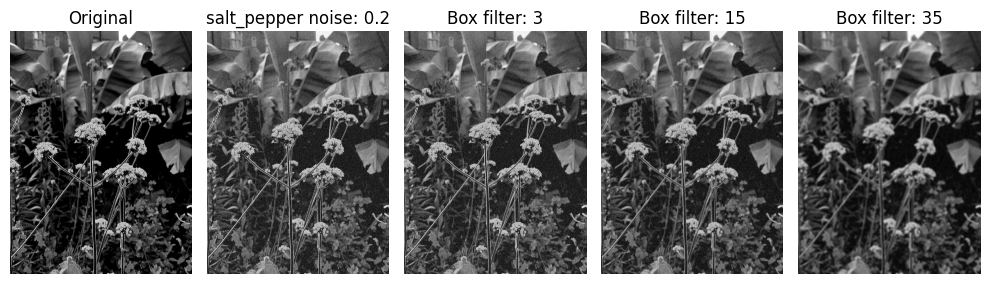


	==> Showing images with box filter for salt_pepper noise 0.5:


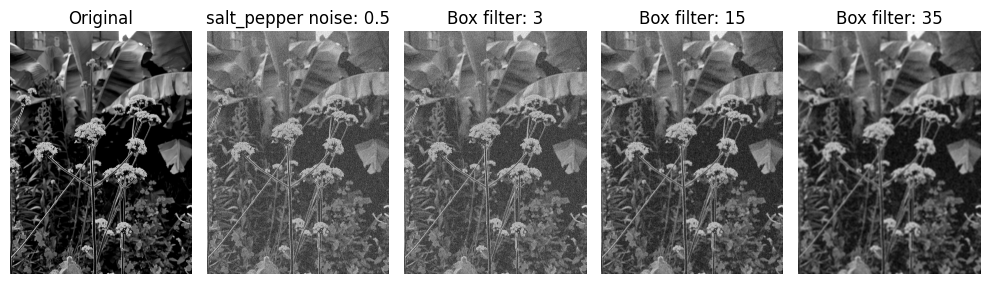

***********************************************
* Showing images with box filter for image 2: *
***********************************************


	==> Showing images with box filter for salt_pepper noise 0.1:


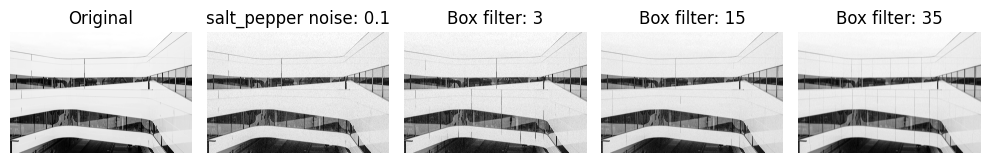


	==> Showing images with box filter for salt_pepper noise 0.2:


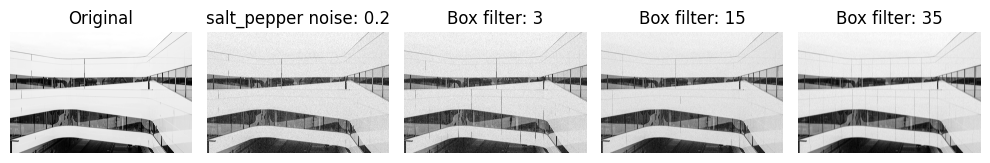


	==> Showing images with box filter for salt_pepper noise 0.5:


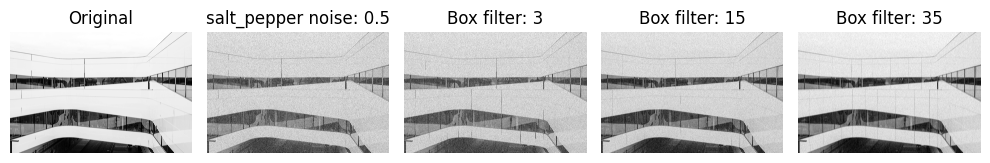

***********************************************
* Showing images with box filter for image 3: *
***********************************************


	==> Showing images with box filter for salt_pepper noise 0.1:


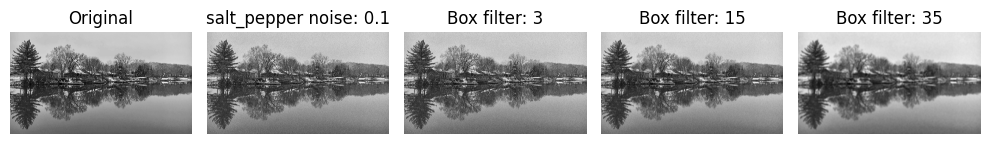


	==> Showing images with box filter for salt_pepper noise 0.2:


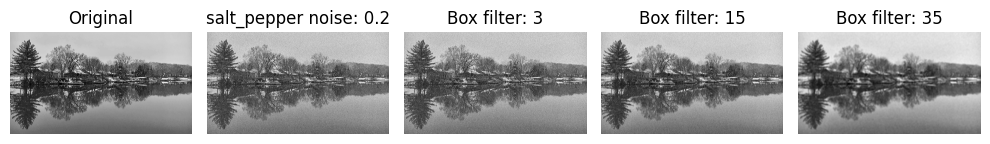


	==> Showing images with box filter for salt_pepper noise 0.5:


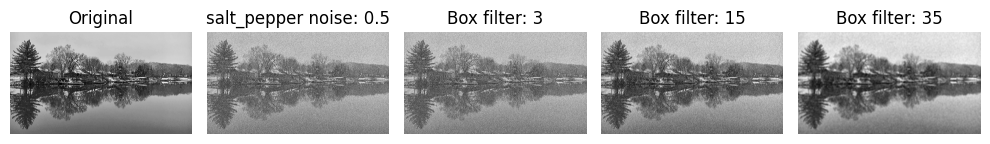

***********************************************
* Showing images with box filter for image 4: *
***********************************************


	==> Showing images with box filter for salt_pepper noise 0.1:


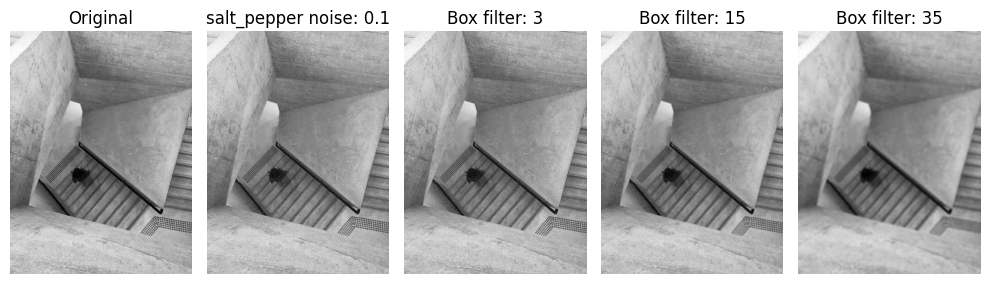


	==> Showing images with box filter for salt_pepper noise 0.2:


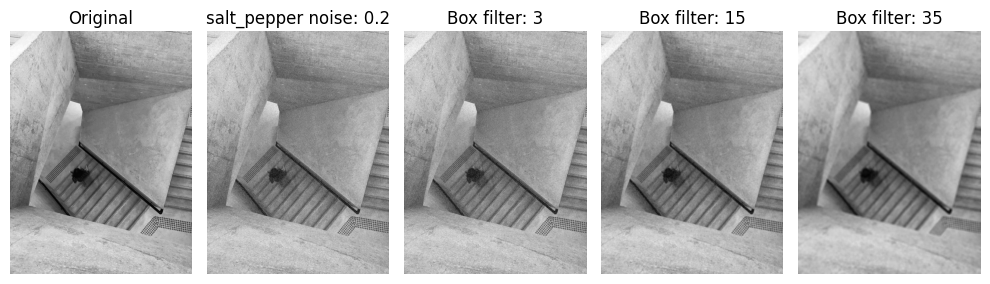


	==> Showing images with box filter for salt_pepper noise 0.5:


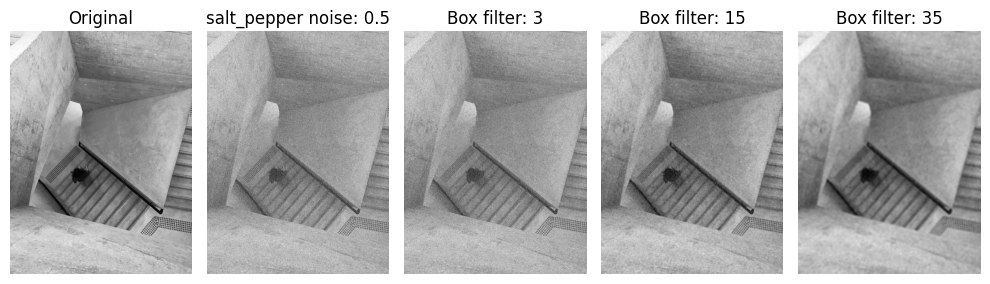

In [122]:
import matplotlib.pyplot as plt


for i in range(len(images)):
    print_with_border(f"Showing images with box filter for image {i + 1}:")

    for j in range(len(salt_pepper_values)):
        print(f"\n\t==> Showing images with box filter for salt_pepper noise {salt_pepper_values[j]}:")

        fig, axs = plt.subplots(1, len(kernel_sizes)+2, figsize=(10, 10))

        axs[0].imshow(images[i], cmap='gray')
        axs[0].axis('off')
        axs[0].set_title('Original')

        axs[1].imshow(images_with_noise[i]['salt_pepper'][j], cmap='gray')
        axs[1].axis('off')
        axs[1].set_title(f'salt_pepper noise: {salt_pepper_values[j]}')

        for k in range(len(kernel_sizes)):
            axs[k+2].imshow(images_with_box_filter_salt_pepper[i][j][k], cmap='gray')
            axs[k+2].axis('off')
            axs[k+2].set_title(f'Box filter: {kernel_sizes[k]}')

        plt.tight_layout()

        plt.show()



### Gaussian Filter

#### Gaussian Noise

In [124]:

#images_with_gaussian_filter_gaussian = {0:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, 1:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, ...}

images_with_gaussian_filter_gaussian = {i: {n: [] for n in range (len(gaus_values))} for i in range(len(images))}

images_with_gaussian_filter_gaussian

for i in range(len(images)):
    for j in range(len(gaus_values)):
        for k in kernel_sizes:
            images_with_gaussian_filter_gaussian[i][j].append(cv2.GaussianBlur(images_with_noise[i]['gaussian'][j], (k, k),0))

            


****************************************************
* Showing images with gaussian filter for image 1: *
****************************************************


	Showing images with gaussian filter for Gaussian noise 50:


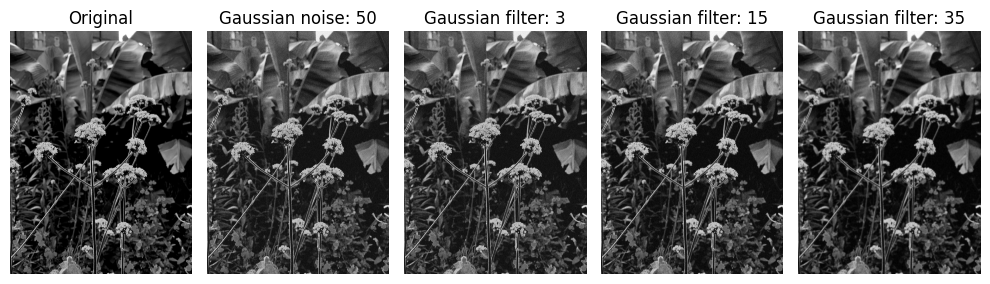


	Showing images with gaussian filter for Gaussian noise 150:


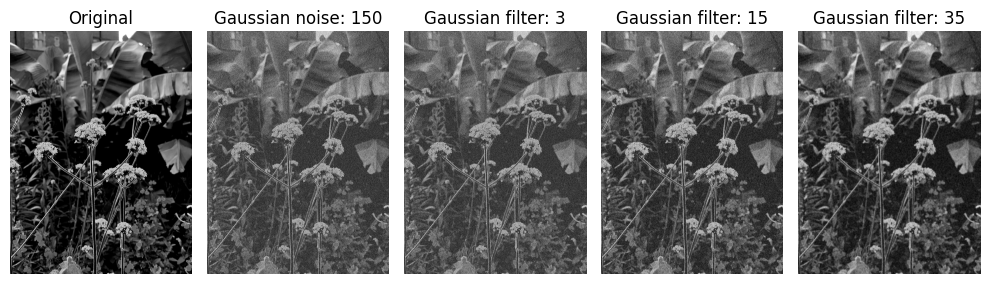


	Showing images with gaussian filter for Gaussian noise 300:


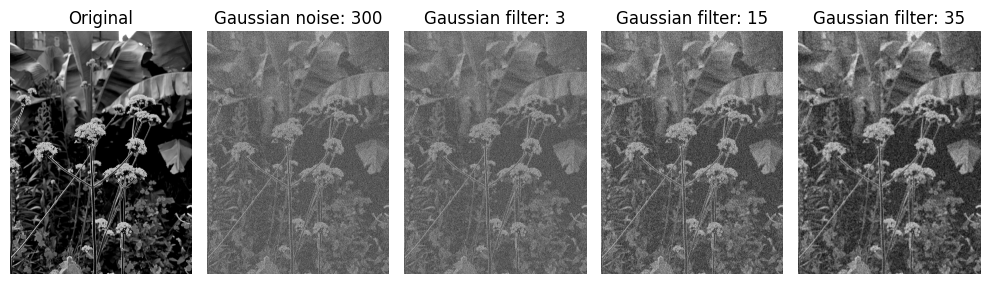

****************************************************
* Showing images with gaussian filter for image 2: *
****************************************************


	Showing images with gaussian filter for Gaussian noise 50:


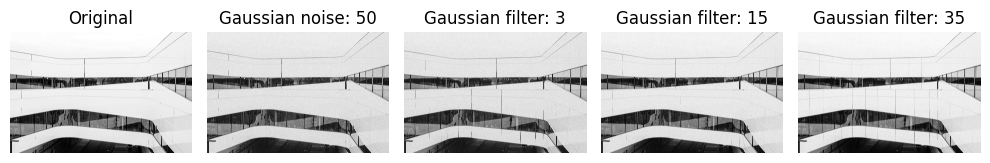


	Showing images with gaussian filter for Gaussian noise 150:


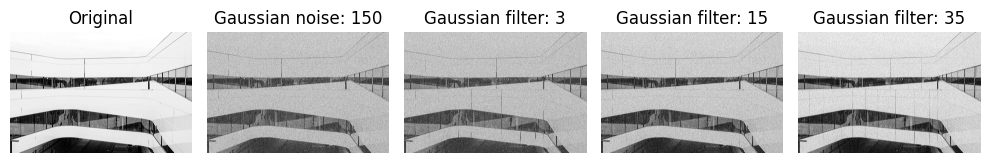


	Showing images with gaussian filter for Gaussian noise 300:


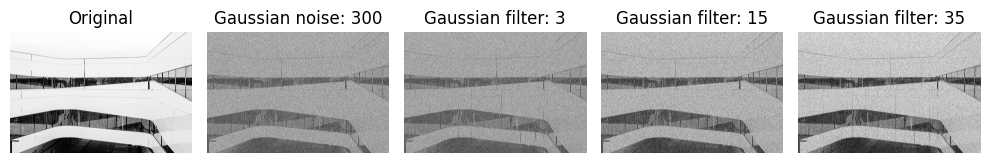

****************************************************
* Showing images with gaussian filter for image 3: *
****************************************************


	Showing images with gaussian filter for Gaussian noise 50:


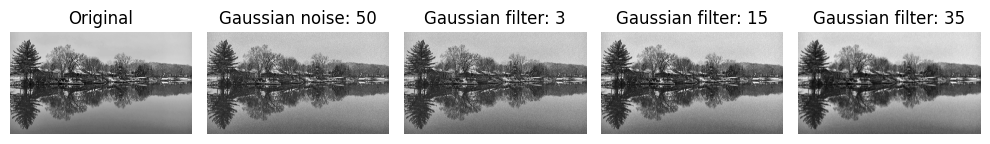


	Showing images with gaussian filter for Gaussian noise 150:


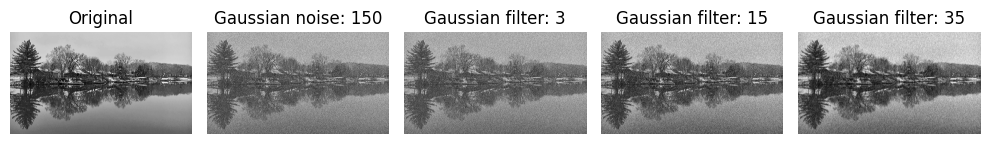


	Showing images with gaussian filter for Gaussian noise 300:


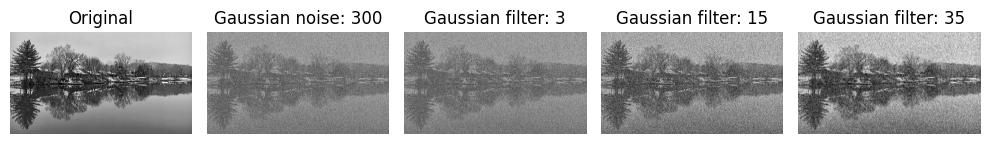

****************************************************
* Showing images with gaussian filter for image 4: *
****************************************************


	Showing images with gaussian filter for Gaussian noise 50:


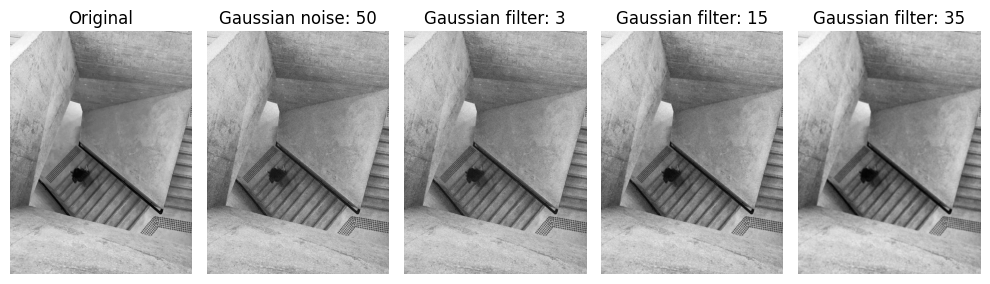


	Showing images with gaussian filter for Gaussian noise 150:


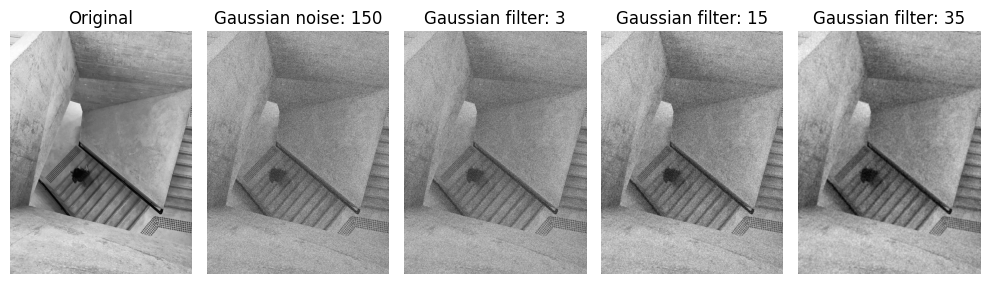


	Showing images with gaussian filter for Gaussian noise 300:


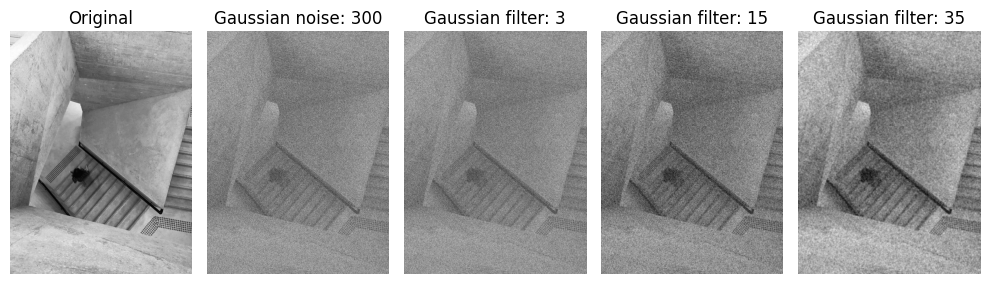

In [126]:



for i in range(len(images)):
    print_with_border(f"Showing images with gaussian filter for image {i + 1}:")

    for j in range(len(gaus_values)):
        print(f"\n\tShowing images with gaussian filter for Gaussian noise {gaus_values[j]}:")

        fig, axs = plt.subplots(1, len(kernel_sizes)+2, figsize=(10, 10))

        axs[0].imshow(images[i], cmap='gray')
        axs[0].axis('off')
        axs[0].set_title('Original')

        axs[1].imshow(images_with_noise[i]['gaussian'][j], cmap='gray')
        axs[1].axis('off')
        axs[1].set_title(f'Gaussian noise: {gaus_values[j]}')

        for k in range(len(kernel_sizes)):
            axs[k+2].imshow(images_with_gaussian_filter_gaussian[i][j][k], cmap='gray')
            axs[k+2].axis('off')
            axs[k+2].set_title(f'Gaussian filter: {kernel_sizes[k]}')

        plt.tight_layout()

        plt.show()

    



#### Salt_Pepper Noise

In [129]:

#images_with_gaussian_filter_salt_pepper = {0:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, 1:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, ...}

images_with_gaussian_filter_salt_pepper = {i: {n: [] for n in range (len(gaus_values))} for i in range(len(images))}

images_with_gaussian_filter_gaussian

for i in range(len(images)):
    for j in range(len(gaus_values)):
        for k in kernel_sizes:
            images_with_gaussian_filter_salt_pepper[i][j].append(cv2.GaussianBlur(images_with_noise[i]['salt_pepper'][j], (k, k),0))

            


****************************************************
* Showing images with gaussian filter for image 1: *
****************************************************


	Showing images with gaussian filter for salt_pepper noise 0.1:


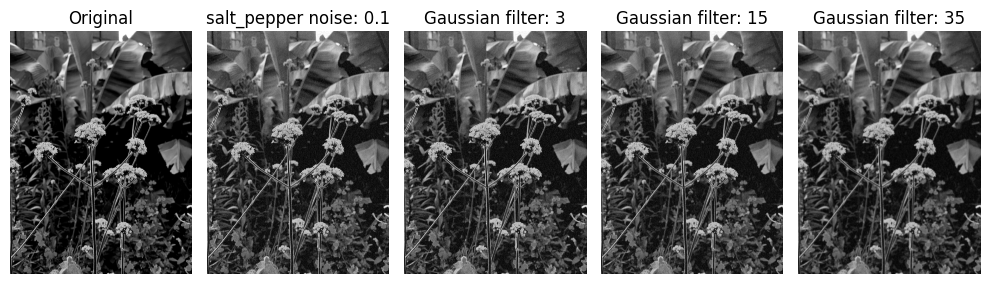


	Showing images with gaussian filter for salt_pepper noise 0.2:


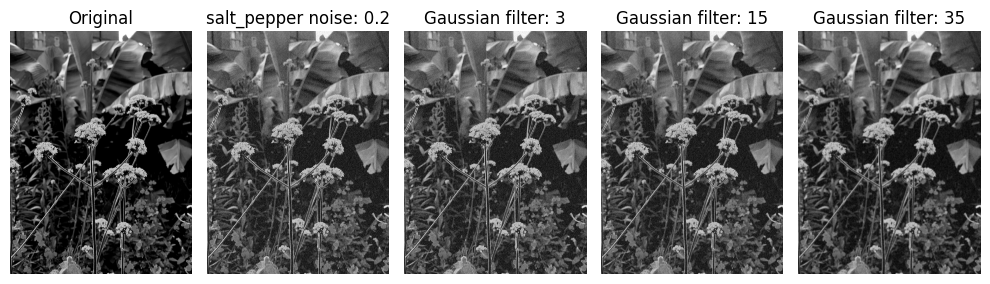


	Showing images with gaussian filter for salt_pepper noise 0.5:


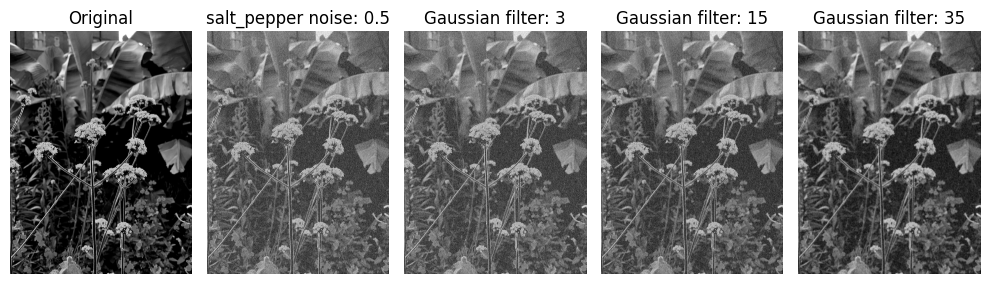

****************************************************
* Showing images with gaussian filter for image 2: *
****************************************************


	Showing images with gaussian filter for salt_pepper noise 0.1:


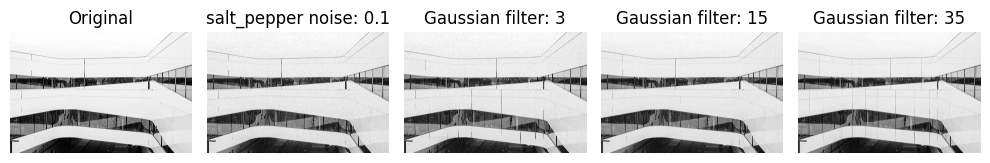


	Showing images with gaussian filter for salt_pepper noise 0.2:


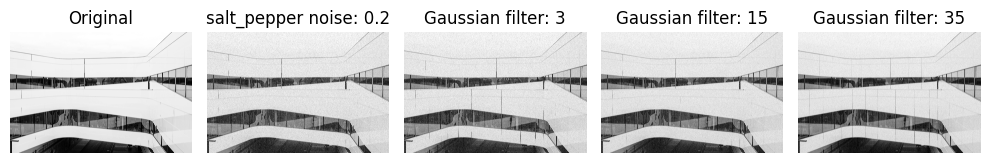


	Showing images with gaussian filter for salt_pepper noise 0.5:


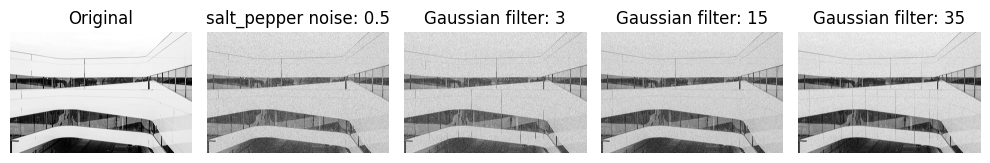

****************************************************
* Showing images with gaussian filter for image 3: *
****************************************************


	Showing images with gaussian filter for salt_pepper noise 0.1:


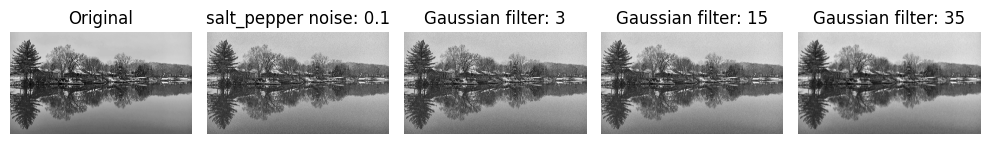


	Showing images with gaussian filter for salt_pepper noise 0.2:


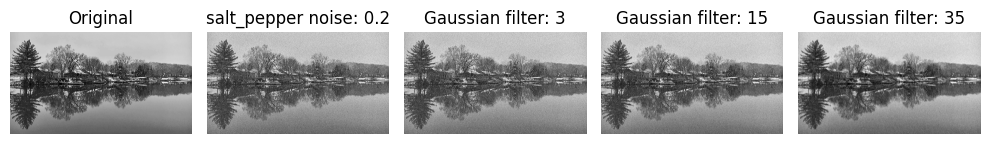


	Showing images with gaussian filter for salt_pepper noise 0.5:


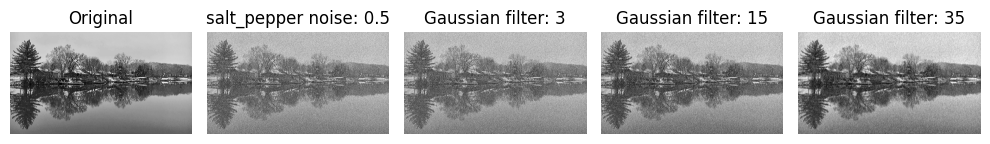

****************************************************
* Showing images with gaussian filter for image 4: *
****************************************************


	Showing images with gaussian filter for salt_pepper noise 0.1:


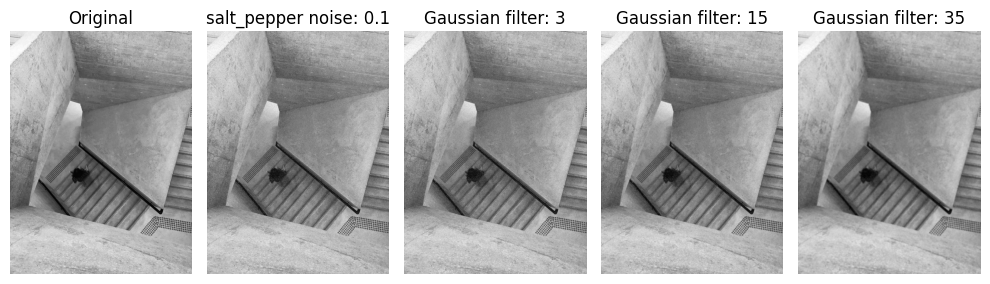


	Showing images with gaussian filter for salt_pepper noise 0.2:


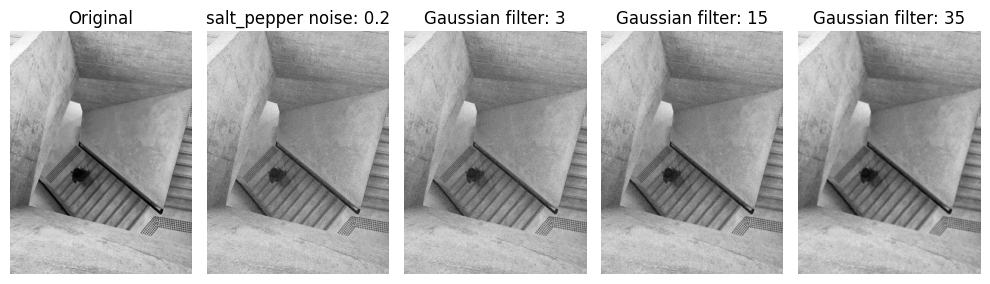


	Showing images with gaussian filter for salt_pepper noise 0.5:


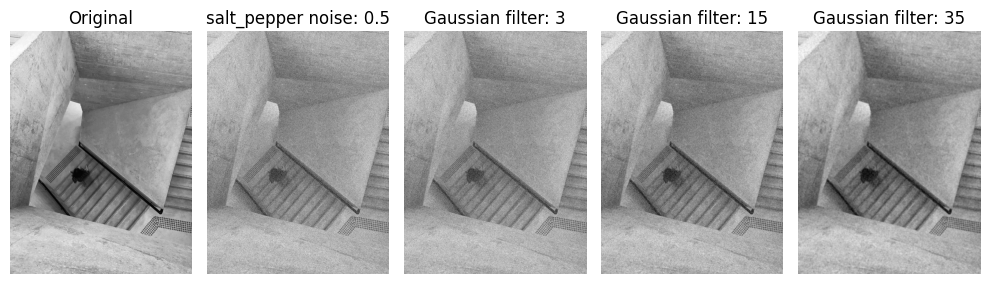

In [131]:



for i in range(len(images)):
    print_with_border(f"Showing images with gaussian filter for image {i + 1}:")

    for j in range(len(gaus_values)):
        print(f"\n\tShowing images with gaussian filter for salt_pepper noise {salt_pepper_values[j]}:")

        fig, axs = plt.subplots(1, len(kernel_sizes)+2, figsize=(10, 10))

        axs[0].imshow(images[i], cmap='gray')
        axs[0].axis('off')
        axs[0].set_title('Original')

        axs[1].imshow(images_with_noise[i]['salt_pepper'][j], cmap='gray')
        axs[1].axis('off')
        axs[1].set_title(f'salt_pepper noise: {salt_pepper_values[j]}')

        for k in range(len(kernel_sizes)):
            axs[k+2].imshow(images_with_gaussian_filter_salt_pepper[i][j][k], cmap='gray')
            axs[k+2].axis('off')
            axs[k+2].set_title(f'Gaussian filter: {kernel_sizes[k]}')

        plt.tight_layout()

        plt.show()

    



### Median Filter

#### Gaussian Noise

In [133]:

#images_with_median_filter_gaussian = {0:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, 1:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, ...}

images_with_median_filter_gaussian = {i: {n: [] for n in range (len(gaus_values))} for i in range(len(images))}

images_with_median_filter_gaussian

for i in range(len(images)):
    for j in range(len(gaus_values)):
        for k in kernel_sizes:
            # here kernel as k
            images_with_median_filter_gaussian[i][j].append(cv2.medianBlur(images_with_noise[i]['gaussian'][j],  k))

            


**************************************************
* Showing images with Median filter for image 1: *
**************************************************


	Showing images with median filter for Gaussian noise 50:


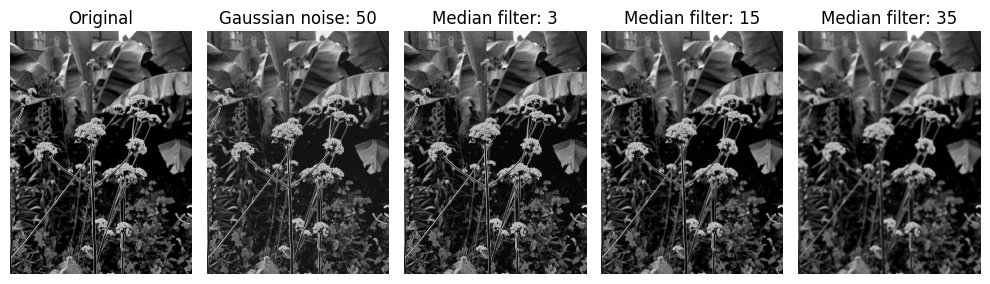


	Showing images with median filter for Gaussian noise 150:


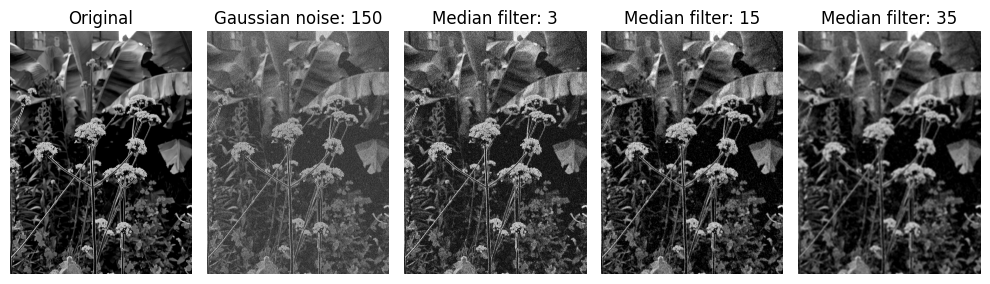


	Showing images with median filter for Gaussian noise 300:


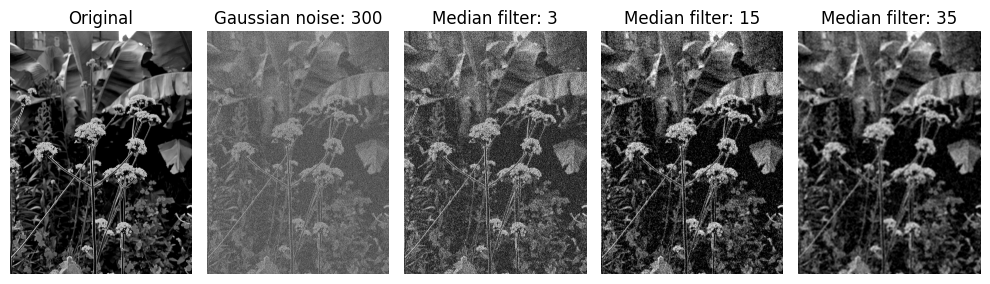

**************************************************
* Showing images with Median filter for image 2: *
**************************************************


	Showing images with median filter for Gaussian noise 50:


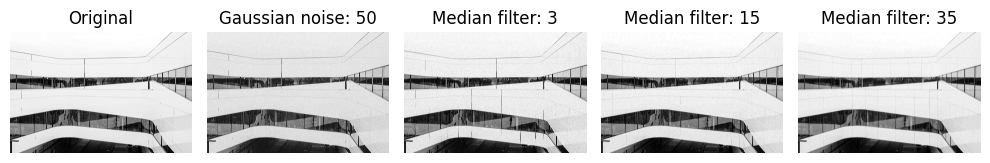


	Showing images with median filter for Gaussian noise 150:


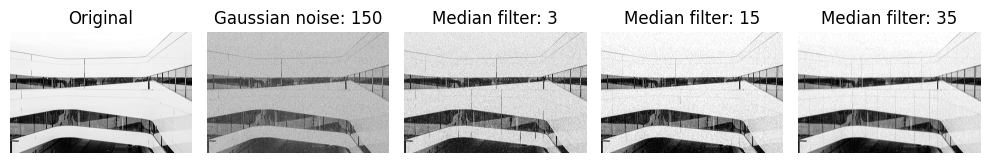


	Showing images with median filter for Gaussian noise 300:


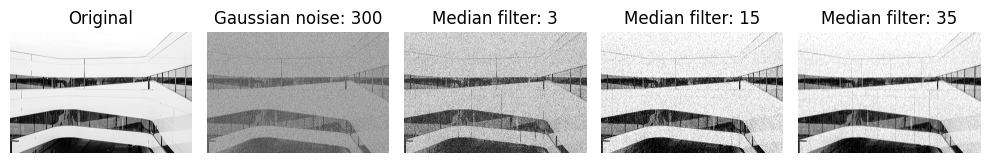

**************************************************
* Showing images with Median filter for image 3: *
**************************************************


	Showing images with median filter for Gaussian noise 50:


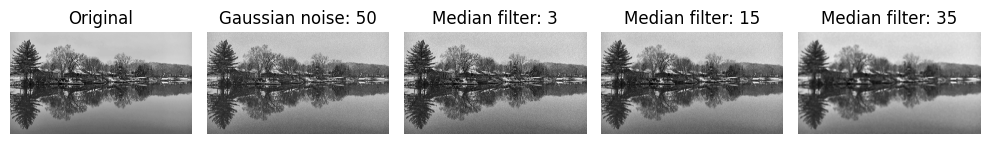


	Showing images with median filter for Gaussian noise 150:


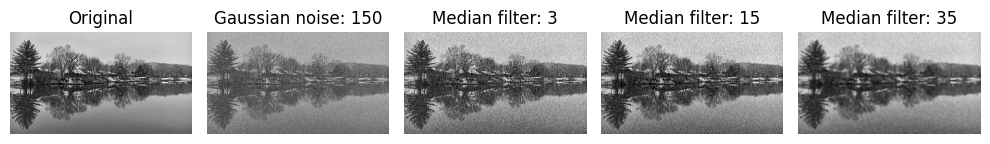


	Showing images with median filter for Gaussian noise 300:


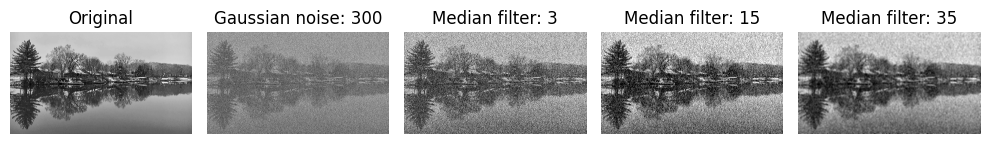

**************************************************
* Showing images with Median filter for image 4: *
**************************************************


	Showing images with median filter for Gaussian noise 50:


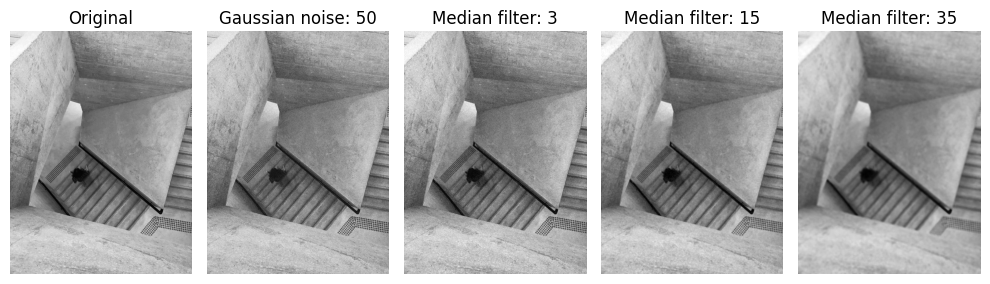


	Showing images with median filter for Gaussian noise 150:


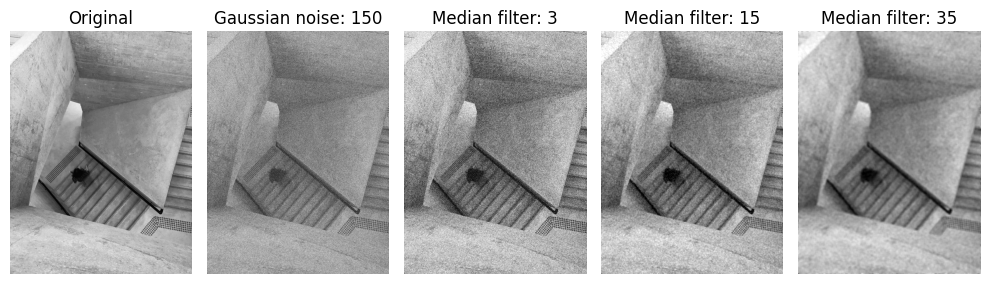


	Showing images with median filter for Gaussian noise 300:


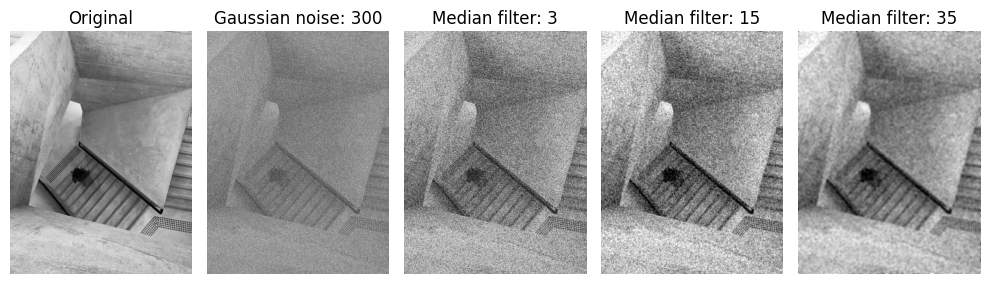

In [134]:



for i in range(len(images)):
    print_with_border(f"Showing images with Median filter for image {i + 1}:")

    for j in range(len(gaus_values)):
        print(f"\n\tShowing images with median filter for Gaussian noise {gaus_values[j]}:")

        fig, axs = plt.subplots(1, len(kernel_sizes)+2, figsize=(10, 10))

        axs[0].imshow(images[i], cmap='gray')
        axs[0].axis('off')
        axs[0].set_title('Original')

        axs[1].imshow(images_with_noise[i]['gaussian'][j], cmap='gray')
        axs[1].axis('off')
        axs[1].set_title(f'Gaussian noise: {gaus_values[j]}')

        for k in range(len(kernel_sizes)):
            axs[k+2].imshow(images_with_median_filter_gaussian[i][j][k], cmap='gray')
            axs[k+2].axis('off')
            axs[k+2].set_title(f'Median filter: {kernel_sizes[k]}')

        plt.tight_layout()

        plt.show()

    



#### Salt_Pepper Noise

In [135]:

#images_with_median_filter_salt_pepper = {0:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, 1:{noise1:[k3, k5, k7], noise2:[k3, k5, k7]}, ...}

images_with_median_filter_salt_pepper = {i: {n: [] for n in range (len(gaus_values))} for i in range(len(images))}

images_with_median_filter_salt_pepper

for i in range(len(images)):
    for j in range(len(gaus_values)):
        for k in kernel_sizes:
            # here kernel as k
            images_with_median_filter_salt_pepper[i][j].append(cv2.medianBlur(images_with_noise[i]['salt_pepper'][j],  k))

            


**************************************************
* Showing images with Median filter for image 1: *
**************************************************


	Showing images with median filter for Salt_Pepper noise 50:


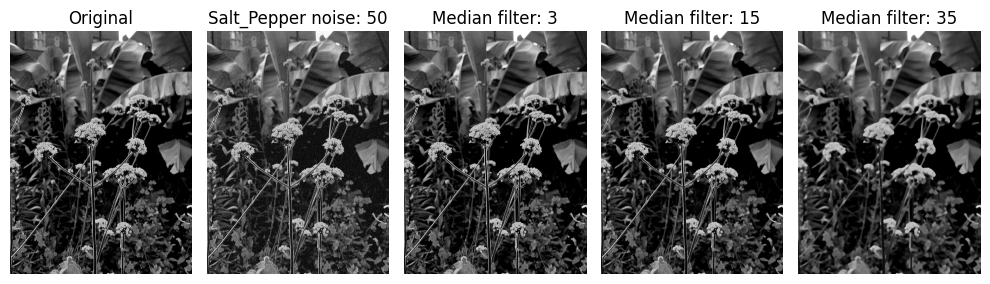


	Showing images with median filter for Salt_Pepper noise 150:


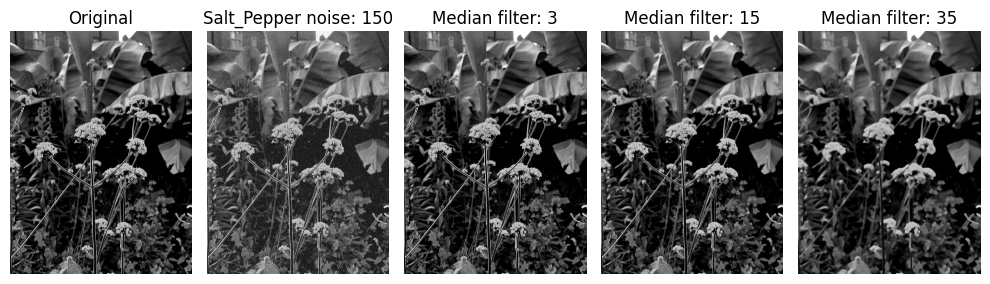


	Showing images with median filter for Salt_Pepper noise 300:


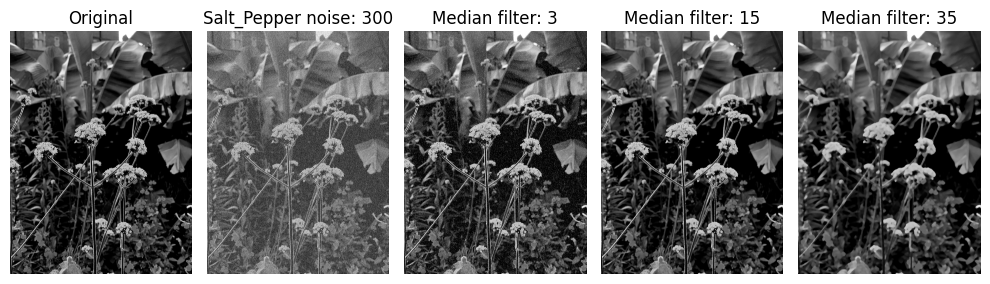

**************************************************
* Showing images with Median filter for image 2: *
**************************************************


	Showing images with median filter for Salt_Pepper noise 50:


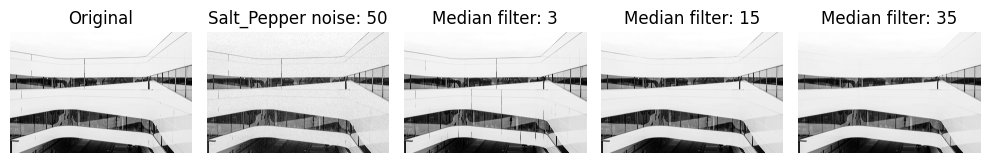


	Showing images with median filter for Salt_Pepper noise 150:


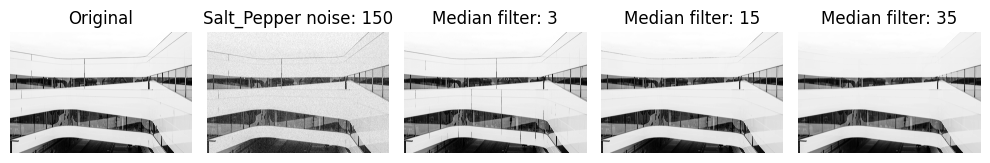


	Showing images with median filter for Salt_Pepper noise 300:


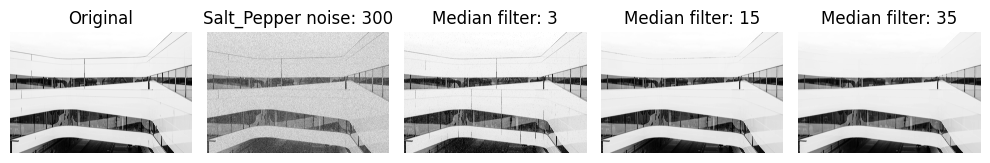

**************************************************
* Showing images with Median filter for image 3: *
**************************************************


	Showing images with median filter for Salt_Pepper noise 50:


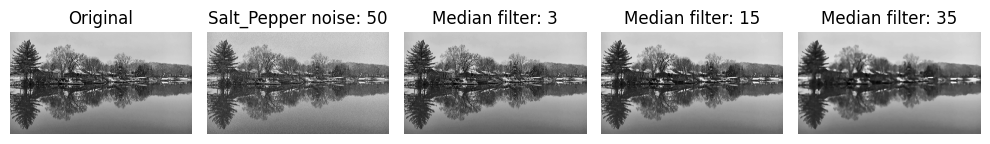


	Showing images with median filter for Salt_Pepper noise 150:


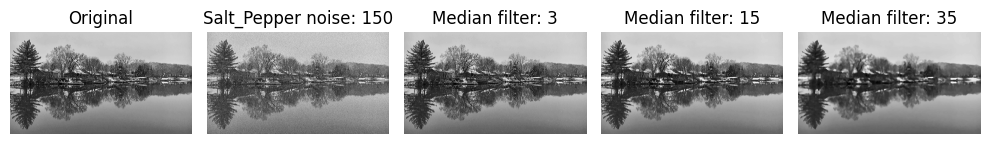


	Showing images with median filter for Salt_Pepper noise 300:


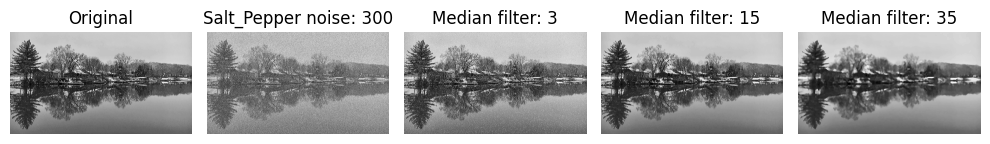

**************************************************
* Showing images with Median filter for image 4: *
**************************************************


	Showing images with median filter for Salt_Pepper noise 50:


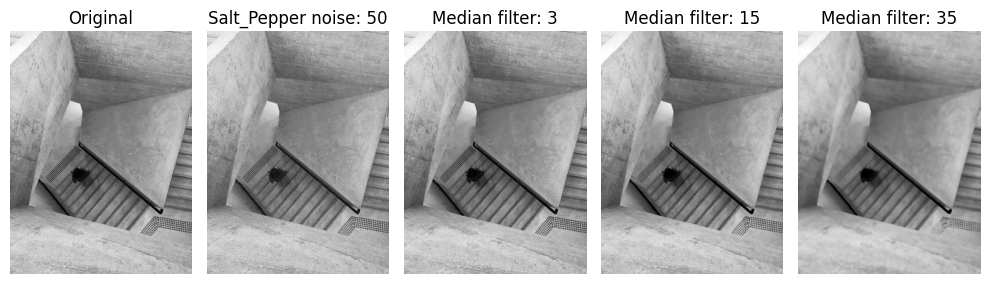


	Showing images with median filter for Salt_Pepper noise 150:


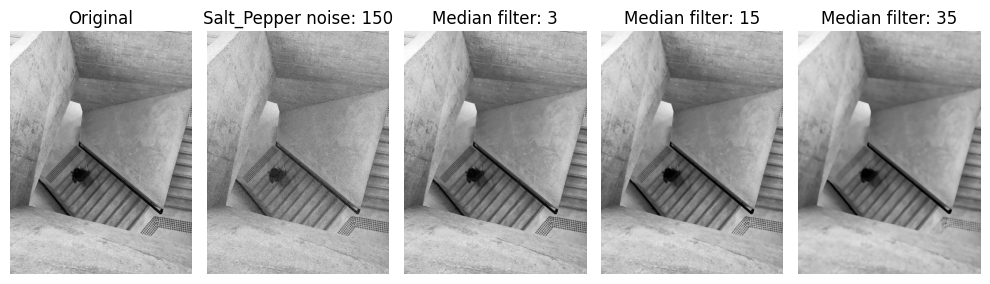


	Showing images with median filter for Salt_Pepper noise 300:


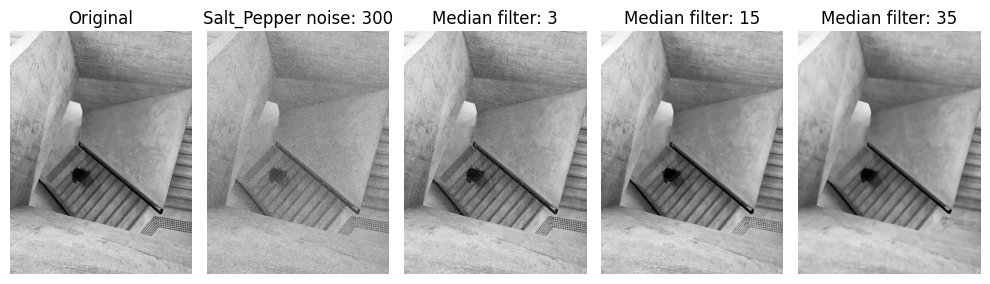

In [136]:



for i in range(len(images)):
    print_with_border(f"Showing images with Median filter for image {i + 1}:")

    for j in range(len(gaus_values)):
        print(f"\n\tShowing images with median filter for Salt_Pepper noise {gaus_values[j]}:")

        fig, axs = plt.subplots(1, len(kernel_sizes)+2, figsize=(10, 10))

        axs[0].imshow(images[i], cmap='gray')
        axs[0].axis('off')
        axs[0].set_title('Original')

        axs[1].imshow(images_with_noise[i]['salt_pepper'][j], cmap='gray')
        axs[1].axis('off')
        axs[1].set_title(f'Salt_Pepper noise: {gaus_values[j]}')

        for k in range(len(kernel_sizes)):
            axs[k+2].imshow(images_with_median_filter_salt_pepper[i][j][k], cmap='gray')
            axs[k+2].axis('off')
            axs[k+2].set_title(f'Median filter: {kernel_sizes[k]}')

        plt.tight_layout()

        plt.show()

    



## Advanced filters